# Bayesian Machine Learning Summer Camp
---

# Transferencia del aprendizaje (*Transfer Learning*)

La transferencia del aprendizaje ocurre cuando tomamos un modelo entrenado para una tarea y lo re-entrenamos en parte para que pueda ejecutar una tarea nueva pero similar. Temas relacionados que no cubriremos seran por ejemplo las tecnicas en el caso few-shot (<<1000 en general), es decir vamos a suponer que tenemos un buen volumen de datos para la nueva tarea.

Pueden adquirir modelos pre-entrenados desde:
* Keras Applications module: Algunos modelos comúnes se pueden cargar desde `keras.applications` .
* [Tensorflow Hub](https://www.tensorflow.org/hub): es un repositorio de modelos entrenados mantenidos por Tensorflow (por cuanto tiempo más dificil saberlo...), donde pueden buscar el modelo que necesitan e implementarlo como una capa de Keras.
* Pueden encontrar algún repositorio GitHub  con la definición del modelo y los pesos. Pueden generar una copia de la arquitectura del modelo y cargar los pesos. Un buen recurso para esto es [Papers With Code](https://paperswithcode.com/)

Vamos a usar la arquitectura [ResNet50](https://arxiv.org/abs/1512.03385)  y cargar los pesos resultantes de entrenar sobre ImageNet (un dataset de más de 14 millones de imagenes pertenecientes a mas de 20k categorías). Este modelo tiene 50 niveles de modulos residuales (Una secuencia de capas de convolución seguidas de activaciones Relu y maxpooling ) y como capa final una capa Fully Connected con 1000 neuronas con softmax. Tiene alrededor de 20 millones de parámetros.

Aquí tienen un ejemplo breve [Keras User-Guide](https://keras.io/guides/transfer_learning/#an-endtoend-example-finetuning-an-image-classification-model-on-a-cats-vs-dogs).


## Datos

Vamos a usar el dataset de perros vs. gatos desde `tensorflow_datasets` ([catalog](https://www.tensorflow.org/datasets/catalog/overview))

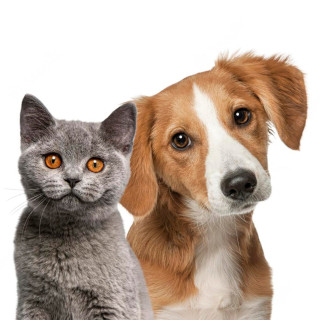

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
import tensorflow.keras as keras
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
setattr(tfds.image_classification.cats_vs_dogs,'_URL',
"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")

train_ds, validation_ds, test_ds = tfds.load(
    "cats_vs_dogs",
    # Reserve 10% for validation and 10% for test
    split=["train[:40%]", "train[40%:50%]", "train[50%:60%]"],
    as_supervised=True,  # Include labels
)

print("Cantidad de ejemplos de entrenamiento: %d" % tf.data.experimental.cardinality(train_ds))
print(
    "Cantidad de ejemplo de validación: %d" % tf.data.experimental.cardinality(validation_ds)
)
print("Cantidad de ejemplos de test: %d" % tf.data.experimental.cardinality(test_ds))

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.
Cantidad de ejemplos de entrenamiento: 9305
Cantidad de ejemplo de validación: 2326
Cantidad de ejemplos de test: 2326


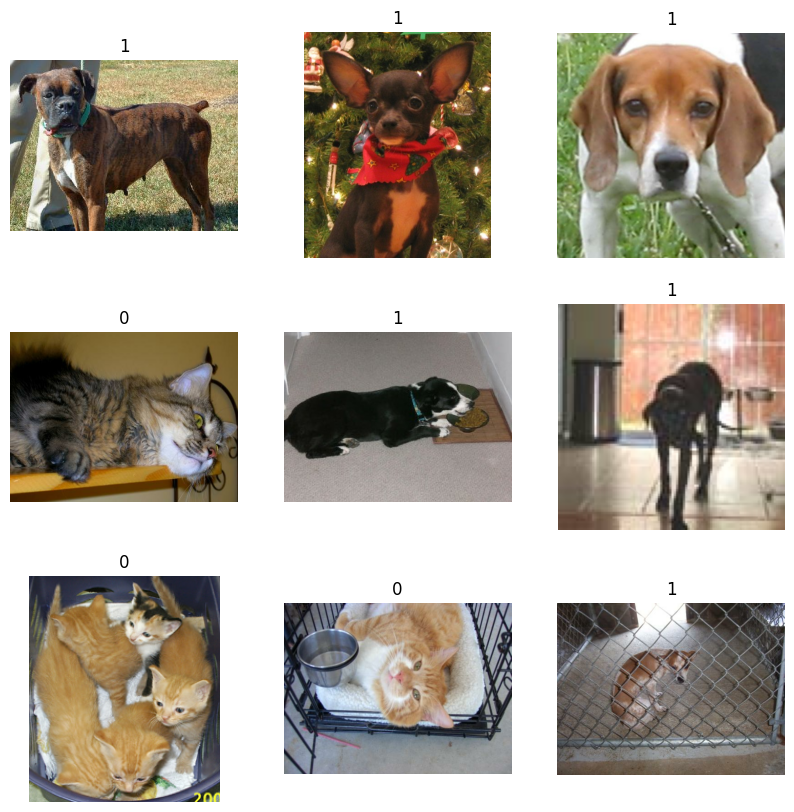

In [ ]:
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(int(label))
    plt.axis("off")



Las imágenes vienen en distintos largos y anchos, asi que las vamos a re-escalear a 224x224. ¿Por qué este valor? porque es el valor que se corresponde a las fotos de ImageNet.

In [ ]:
size = (224, 224)

train_ds = train_ds.map(lambda x, y: (tf.image.resize(x, size), y))
validation_ds = validation_ds.map(lambda x, y: (tf.image.resize(x, size), y))
test_orig_ds = test_ds #guardemos las imágenes originales antes de transformarlas, para visualizarlas después
test_ds = test_ds.map(lambda x, y: (tf.image.resize(x, size), y))

Elegimos el batch size que nos permite la memoria de la GPU y preparamos las siguientes imagenes a tomar en memoria.

In [ ]:
batch_size = 64

train_ds = train_ds.cache().batch(batch_size).prefetch(buffer_size=15)
validation_ds = validation_ds.cache().batch(batch_size).prefetch(buffer_size=15)
test_ds = test_ds.cache().batch(batch_size).prefetch(buffer_size=15)

## Data Augmentation

Nuesto dataset no es grande (menos de 10k ejemplos), vamos entonces a usar aumentación del dataset para reducir el over-fitting y mejorar el entrenamiento. Vamos a hacer una reflexión horizontal al azar y una rotación al azar, esto se va a ejecutar en cada batch generando imágenes ligeramente diferentes cada vez.


Cosas a considerar que no exploraremos demasiado:
- Si la aumentación es costosa y se pretende entrenar por varias epochs quizas conviene generar un dataset aumentado y guardarlo en disco.
- SI la aumentación es altamente paralelizable hay que ser cuidadoso de que este ocurriendo en la GPU. Pero ojo porque esto nos va a consumir los recursos de la GPU.

Aquí lo implementamos con un Keras Layer que solo hace la transformación durante el entrenamiento. Al ser una capa hará la transformación en el device que hayamos elegido.

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(0.1),
    ]
)

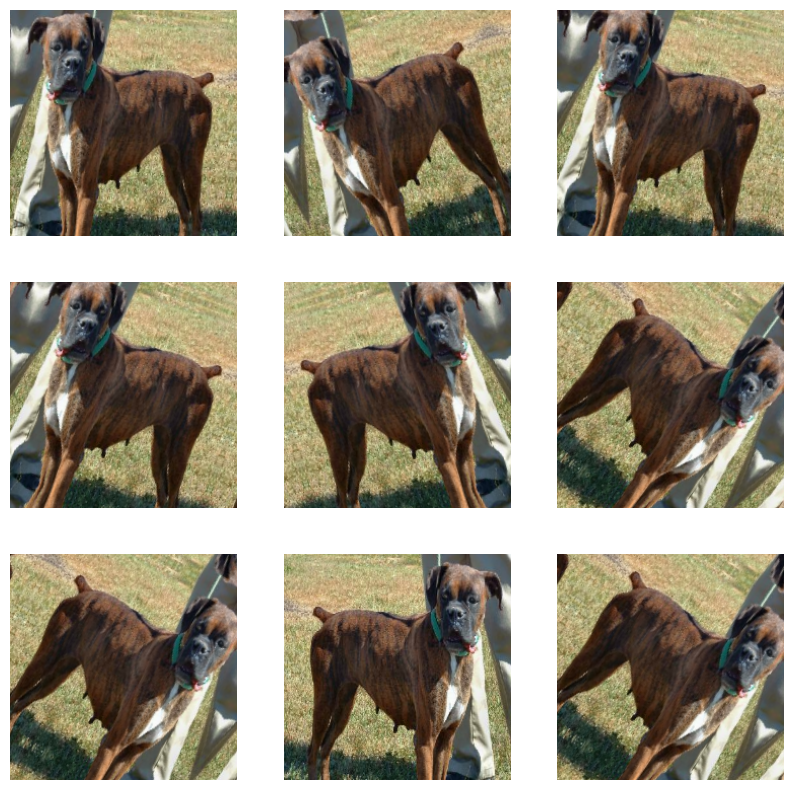

In [ ]:
import numpy as np

for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        plt.imshow(augmented_image[0].numpy().astype("int32"))
        plt.axis("off")

## Importamos el modelo base

Carquemos el modelo base. Poniendo`include_top=False` le decimos a Keras que ignore la cabeza del modelo (la capa final). Lo reemplazamos por una cabeza con solo dos clases.

In [ ]:
base_model = keras.applications.ResNet50(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    include_top=False,
)  # Do not include the ImageNet classifier at the top.


94765736/94765736 [==============================] - 0s 0us/step


El entrenamiento de todas las capas del modelo consumiría mas tiempo que el de una sola parte y podría llevar a over-fitting.

En principio vamos a hacer un _freeze_ de los pesos del modelo base.







In [ ]:
# Freeze the base_model
base_model.trainable = False

Usamos la API funcional para construir nuestro modelo:
* La primera capa seran las transformaciones que definimos antes.
* Entonces tenemos que asegurarnos que la entrada de la red tenga el mismo pre-procesamiento que en el modelo pre-entrenado.
* Luego aplicamos nuestro modelo base
* Sumamos una cabeza final: Con [GlobalAveragePooling(1)](https://paperswithcode.com/method/global-average-pooling), Dropout , y una capa Densa con activación sigmoide, esta capa será la que entrenaremos.


(1)"*Global Average Pooling* es una operación de pooling diseñada para sustituir a las capas totalmente conectadas en las CNN clásicas. La idea es generar un mapa de características para cada categoría correspondiente de la tarea de clasificación en la última capa convolucional. En lugar de añadir capas totalmente conectadas sobre los mapas de características, tomamos la media de cada mapa de características y el vector resultante se introduce directamente en la capa softmax. Una de las ventajas de Global Average Pooling* sobre las capas totalmente conectadas es que es más nativa de la estructura de convolución al reforzar las correspondencias entre los mapas de características y las categorías."

In [ ]:
# Create new model on top
inputs = keras.Input(shape= (224, 224, 3))
x = data_augmentation(inputs)  # Aplicamos las transformaciones de aumentación

# Rescaleamos
x = keras.applications.resnet.preprocess_input(x)

# El modelo base contiene capas de batchnorm. Queremos mantenerlos en modo de inferencia.
# cuando descongelamos el modelo base para ajustarlo, así nos aseguramos de que el
# modelo base se está ejecutando en modo de inferencia aquí.

x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = keras.layers.Dense(1)(x)
model = keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (  (None, 224, 224, 3)       0         
 SlicingOpLambda)                                                
                                                                 
 tf.nn.bias_add (TFOpLambda  (None, 224, 224, 3)       0         
 )                                                               
                                                                 
 resnet50 (Functional)       (None, None, None, 2048   23587712  
                             )                                   
                                                             

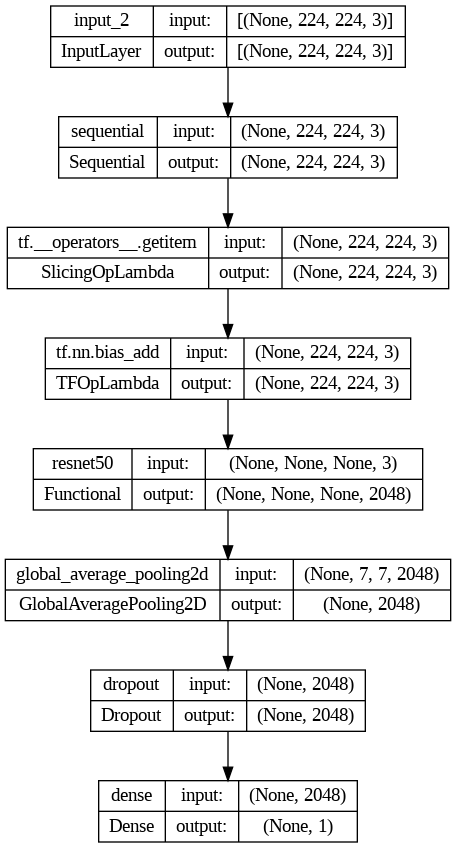

In [ ]:
keras.utils.plot_model(model, show_shapes=True)

## Entrenamos

Para usar tensorboard recargamos la extensión.

In [ ]:
%load_ext tensorboard

ponemos el callback adecuado

In [ ]:
#removemos viejos ajustes
!rm -rf ./logs/

#guardamos el archivo:
import datetime
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

#definimos un callback:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


inicializamos tensorboard

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

y vemos la magia cuando ajustamos con el callback

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy()],
)

epochs = 5

model.fit(train_ds, epochs=epochs, validation_data=validation_ds, callbacks = [tensorboard_callback])

Epoch 1/5
146/146 [==============================] - 61s 321ms/step - loss: 0.1527 - binary_accuracy: 0.9310 - val_loss: 0.0627 - val_binary_accuracy: 0.9807
Epoch 2/5
146/146 [==============================] - 45s 309ms/step - loss: 0.0607 - binary_accuracy: 0.9772 - val_loss: 0.0463 - val_binary_accuracy: 0.9850
Epoch 3/5
146/146 [==============================] - 44s 301ms/step - loss: 0.0463 - binary_accuracy: 0.9834 - val_loss: 0.0424 - val_binary_accuracy: 0.9858
Epoch 4/5
146/146 [==============================] - 45s 307ms/step - loss: 0.0436 - binary_accuracy: 0.9826 - val_loss: 0.0362 - val_binary_accuracy: 0.9875
Epoch 5/5
146/146 [==============================] - 50s 341ms/step - loss: 0.0395 - binary_accuracy: 0.9844 - val_loss: 0.0362 - val_binary_accuracy: 0.9875


## *Fine Tunning* (Sintonía fina)

Como vimos antes, las últimas capas del modelo son muy especificas de la tarea. Con lo cual podemos descongelarlas y que se adapten un poco mejor a solamente detectar perros y gatos.


In [ ]:
# Descongelamos el modelo base.

base_model.trainable = True
model.summary()

model.compile(
    optimizer=keras.optimizers.Adam(1e-5),  # Low learning rate
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy()],
)

epochs = 1
model.fit(train_ds, epochs=epochs, validation_data=validation_ds, callbacks = [tensorboard_callback])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (  (None, 224, 224, 3)       0         
 SlicingOpLambda)                                                
                                                                 
 tf.nn.bias_add (TFOpLambda  (None, 224, 224, 3)       0         
 )                                                               
                                                                 
 resnet50 (Functional)       (None, None, None, 2048   23587712  
                             )                                   
                                                             

## Predecimos y evaluamos

Computamos las predicciones del primer lote:

In [ ]:
preds = model.predict(test_ds.take(1))

1/1 [==============================] - 2s 2s/step


Veamos que tan bien nos fue en el entrenamiento.

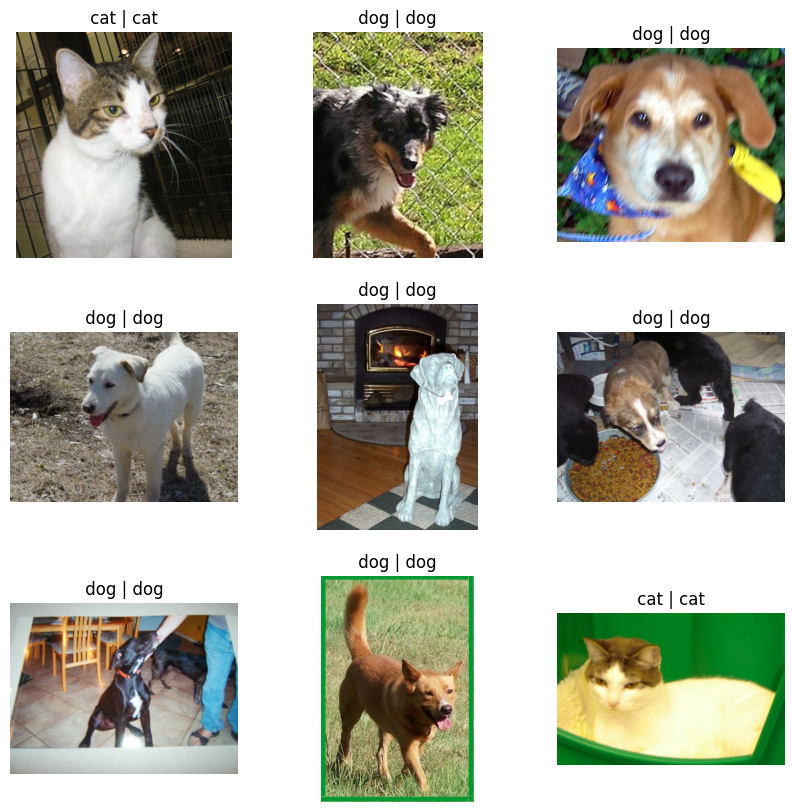

In [ ]:
import matplotlib.pyplot as plt
labels=[' cat ',' dog ']
plt.figure(figsize=(10, 10))

for i, (image, label) in enumerate(test_orig_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(labels[int(label)] + '|' + labels[int(preds[i]>0)])
    plt.axis("off")

Veamos la métrica final sobre validación, un poco mejoró. Se podria probar alguna época más.

In [ ]:
model.evaluate(validation_ds)

37/37 [==============================] - 7s 188ms/step - loss: 0.0342 - binary_accuracy: 0.9867


[0.03416307270526886, 0.9866724014282227]

La métrica sobre todo el conjunto de testeo es (si no explota Colab...)

In [ ]:
model.evaluate(test_ds)

 9/37 [======>.......................] - ETA: 5s - loss: 0.0216 - binary_accuracy: 0.9931